# Permanent magnet assembly B-field simulation

## 3 rings

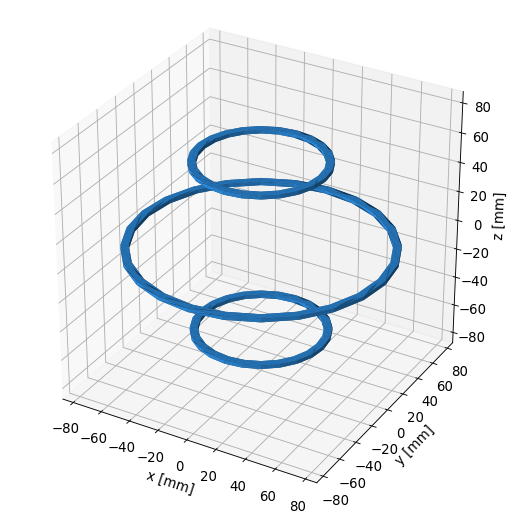

On x-axis:
Maximum B-field: 5.263 G
Central B-field: 5.263 G
Min nonuniformity: 0.0
Max nonuniformity:0.006612135136831043


On y-axis:
Maximum B-field: 5.263 G
Central B-field: 5.263 G
Min nonuniformity: 0.0
Max nonuniformity:0.006612135136831043


On z-axis:
Maximum B-field: 5.263 G
Central B-field: 5.263 G
Min nonuniformity: 0.0
Max nonuniformity:0.01868731391338256


Uniform region width with threshold 1e-06: x = 0.15 cm, y = 0.15 cm, z = 0.092 cm


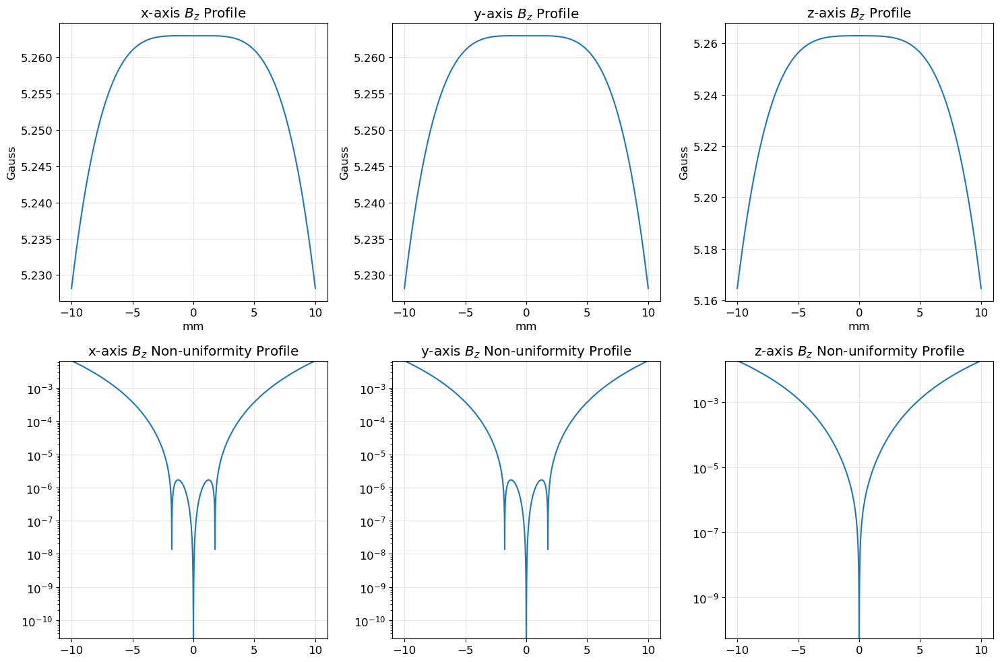

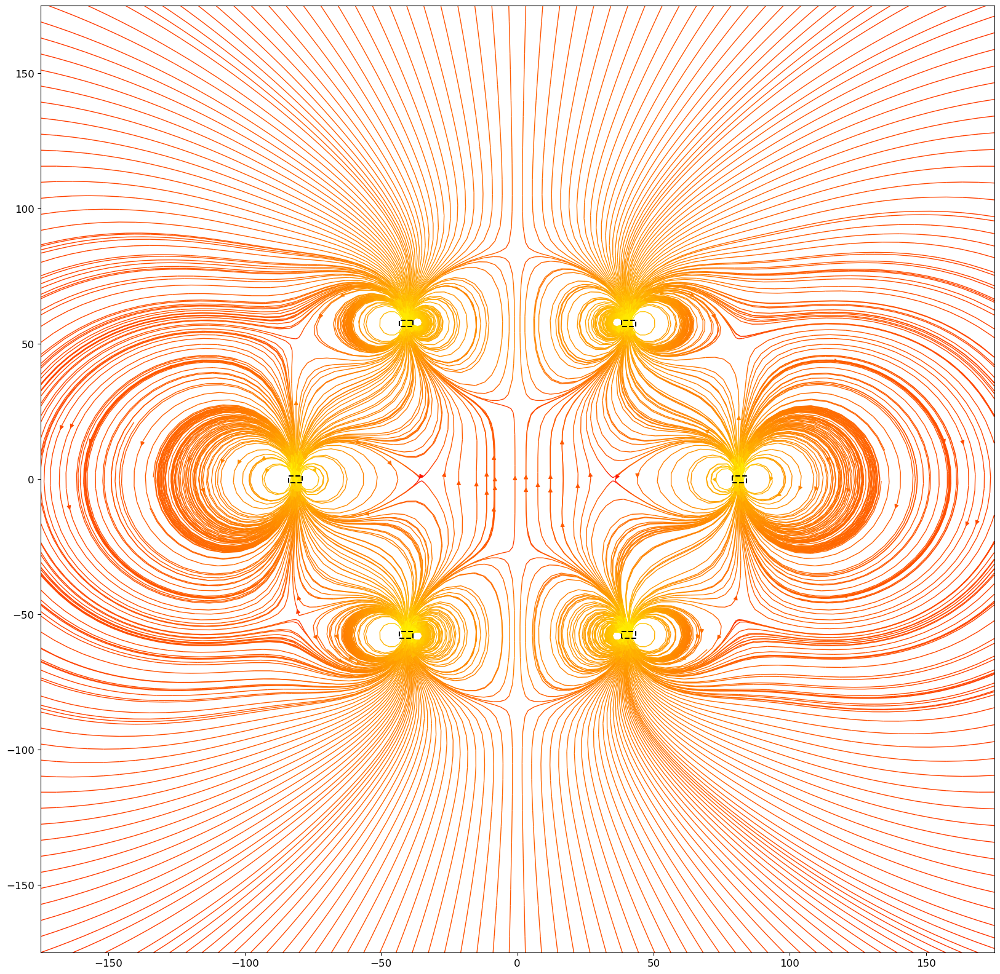

In [8]:
import numpy as np
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream
import magpylib as magpy
from magpylib.magnet import CylinderSegment


thickness = 2.4
width = 5
innerrad = 33.354

""" following definition of maxwell coil"""
#inner radius of middle coil
# innerrad_mid = np.sqrt(7/4) * (innerrad + width/2) - width/2
# coil separation
# maxwell_dist = np.sqrt(3/7) * innerrad_mid

"""custom definition"""
innerrad_mid = 3 * (innerrad + width/2)
maxwell_dist = 0.5 * innerrad_mid

"""custom definition"""
"""
achieves 3.5e-5 maximum nonuniformity over 8mm
"""
innerrad = 38.354
width = 5
innerrad_mid = 1.94 * (innerrad + width/2)
maxwell_dist = 1.5 * innerrad

"""custom definition"""
"""
achieves 2e-5 maximum nonuniformity over 7mm
"""
innerrad = 38.354
width = 5
innerrad_mid = 1.938 * (innerrad + width/2)
maxwell_dist = 1.5 * innerrad

"""custom definition"""
"""
achieves 2e-6 maximum nonuniformity over 4mm
"""
innerrad = 38.354
innerrad_mid = 2.06 * (innerrad)
maxwell_dist = 1.5 * innerrad

Br = 1.09e3 # in mT
mT_to_T = 1e3
mT_to_G = 10

# define rings in maxwell coil
maxwell3 = magpy.Collection()
ring_top = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad, innerrad + width, thickness, 0, 360),
                           position = (0, 0, +maxwell_dist))
ring_mid = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad_mid, innerrad_mid + width, thickness, 0, 360),
                           position = (0, 0, 0))
ring_bot = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad, innerrad + width, thickness, 0, 360),
                           position = (0, 0, -maxwell_dist))
maxwell3.add(ring_top).add(ring_bot).add(ring_mid)
# maxwell3.add(ring_mid)

x_len = 10
magpy.show(maxwell3, style_magnetization_show=False)
get_field_on_axes(maxwell3, [[-x_len,x_len], [-x_len,x_len], [-x_len,x_len]], True)

x_bounds = [-175, 175]
z_bounds = [-175, 175]
outerrad = innerrad + width
nearsurface_z = maxwell_dist - thickness/2
farsurface_z = maxwell_dist + thickness/2

outerrad_mid = innerrad_mid + width

cross_section_3_coils = np.array([
    [[-innerrad,-innerrad,-outerrad,-outerrad,-innerrad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z]],
    [[innerrad,innerrad,outerrad,outerrad,innerrad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z]],
    [[-innerrad,-innerrad,-outerrad,-outerrad,-innerrad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z]],
    [[innerrad,innerrad,outerrad,outerrad,innerrad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z]],
    [[-innerrad_mid,-innerrad_mid,-outerrad_mid,-outerrad_mid,-innerrad_mid], [thickness/2,-thickness/2,-thickness/2,thickness/2,thickness/2]],
    [[innerrad_mid,innerrad_mid,outerrad_mid,outerrad_mid,innerrad_mid], [thickness/2,-thickness/2,-thickness/2,thickness/2,thickness/2]],
])
make_flux_stream(maxwell3, x_bounds, z_bounds, cross_section_3_coils)

On x-axis:
Maximum B-field: 5.263 G
Central B-field: 5.263 G
Min nonuniformity: 0.0
Max nonuniformity:0.006612135136831043


On y-axis:
Maximum B-field: 5.263 G
Central B-field: 5.263 G
Min nonuniformity: 0.0
Max nonuniformity:0.006612135136831043


On z-axis:
Maximum B-field: 5.263 G
Central B-field: 5.263 G
Min nonuniformity: 0.0
Max nonuniformity:1.4274516368140573




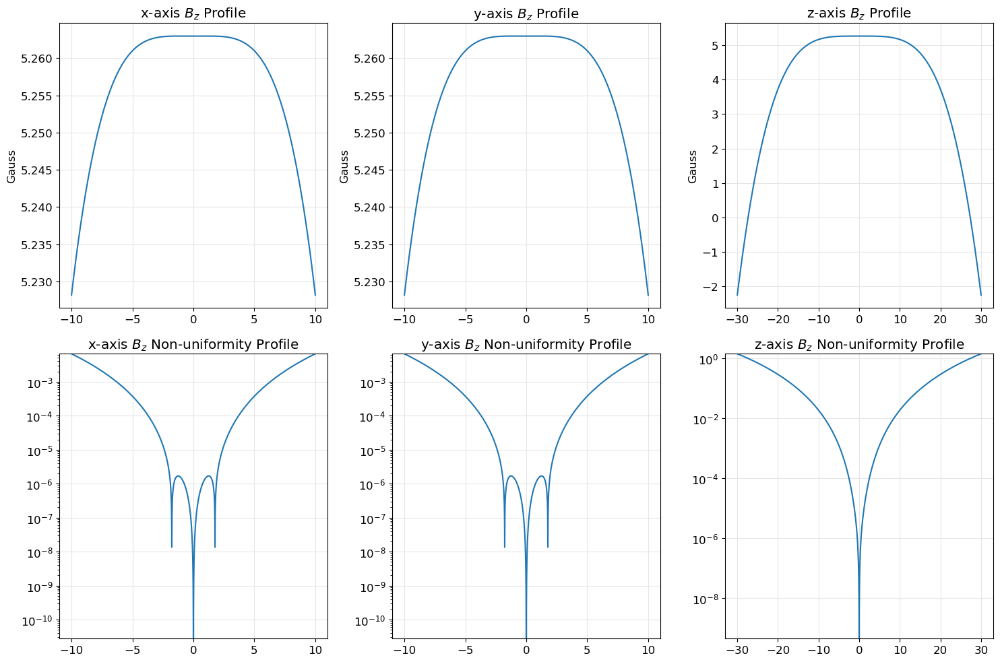

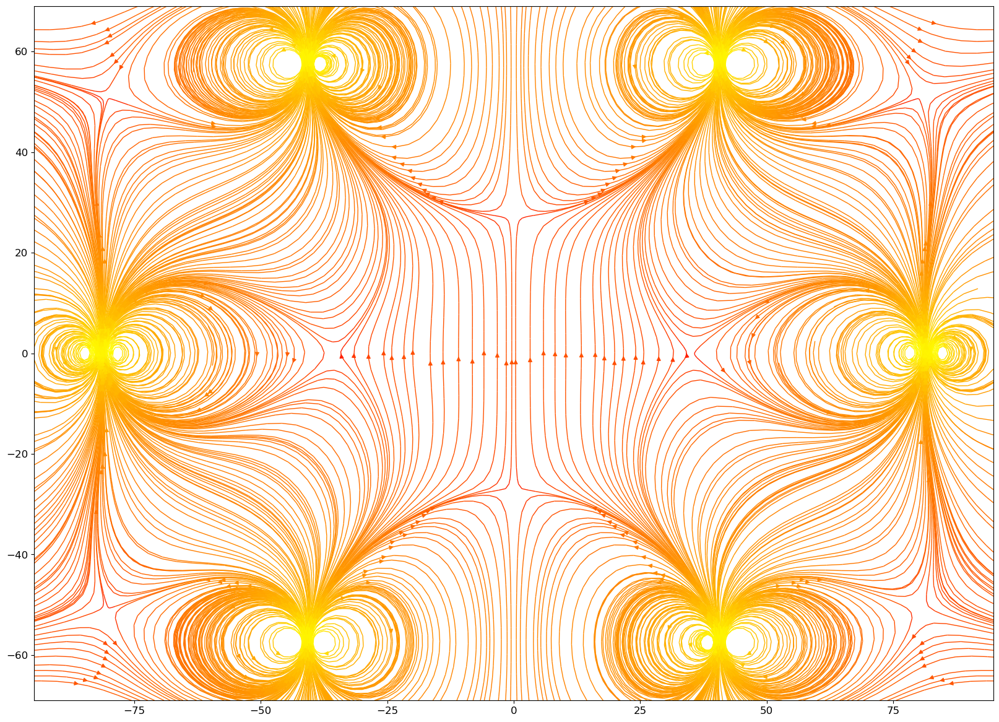

In [3]:
import numpy as np
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream
import magpylib as magpy
from maggeometry import three_rings

innerrad2 = 38.354
innerrad1 = 2.06 * (innerrad2)
dist = 1.5 * innerrad2
thickness = 2.4
width = 5

Br = 1.09e3 # in mT
magnets = three_rings(Br, innerrad1, innerrad2, width, thickness, dist)

sens_len = 10
get_field_on_axes(magnets, [[-sens_len, sens_len], [-sens_len, sens_len], [-sens_len-20, sens_len+20]], True)
x_bounds = [-1.2*innerrad1, 1.2*innerrad1]
z_bounds = [-1.2*dist, 1.2*dist]

make_flux_stream(magnets, x_bounds, z_bounds, [])

In [1]:
import numpy as np
import magpylib as magpy
from maggeometry import n_rings, four_rings
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream, centered_sweep_range, get_grid_nonuniformity, make_xy_grid

In [3]:
Br = 1.09e3
mag_dir = (0,0,1)
mirror1_z = False
ringset_1_config = [Br, mag_dir, mirror1_z]

r = 1.09e3
mag_dir = (0,0,1)
mirror2_z = True
ringset_2_config = [Br, mag_dir, mirror2_z]
# innerrad1, width1, thickness1, innerrad2, width2, thickness2, dist2
bounds = ((1, 150), (2, 20), (2, 20),
          (1, 150), (2, 20), (2, 20), (1, 300))
x = [137.32347641,  19.84159108,   2.,           6.44369934,  2., 8.75859682, 286.9671474 ]
results_x = [x]

In [7]:
from maggeometry import n_rings
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream, centered_sweep_range, get_grid_nonuniformity, make_xy_grid
grid_res = 101
grid = make_xy_grid([-10, 10], [-10, 10], grid_res)
results_g_center = []
results_nonun = []
for x in results_x:
    obj_ring_config=[[*ringset_1_config, *x[0:3], 0], [*ringset_2_config, *x[3:7]]]
    magnets = n_rings(obj_ring_config)
    grid_field, center_field, av_nonuniformity, max_abs_nonuniformity = get_grid_nonuniformity(magnets, grid, grid_res)
    results_g_center.append(center_field)
    results_nonun.append(av_nonuniformity)
print(results_g_center)
print(results_nonun)

[9.900000002324163]
[0.007298427059617117]


On x-axis:
Maximum B-field: -9.9 G
Central B-field: -9.9 G
Min nonuniformity: 0.0
Max nonuniformity:0.010736678700238743


On y-axis:
Maximum B-field: -9.9 G
Central B-field: -9.9 G
Min nonuniformity: 0.0
Max nonuniformity:0.010736678700238743


On z-axis:
Maximum B-field: -8.156 G
Central B-field: -9.9 G
Min nonuniformity: 0.0
Max nonuniformity:0.17617478994143318




/Users/nelson/Documents/quantum/quantum_notes/projects/b_field/simulations/b-field-uniformity/maghelper.py:264: UserWarning:

Attempt to set non-positive ylim on a log-scaled axis will be ignored.

/Users/nelson/Documents/quantum/quantum_notes/projects/b_field/simulations/b-field-uniformity/maghelper.py:270: UserWarning:

Attempt to set non-positive ylim on a log-scaled axis will be ignored.

/Users/nelson/Documents/quantum/quantum_notes/projects/b_field/simulations/b-field-uniformity/maghelper.py:276: UserWarning:

Attempt to set non-positive ylim on a log-scaled axis will be ignored.



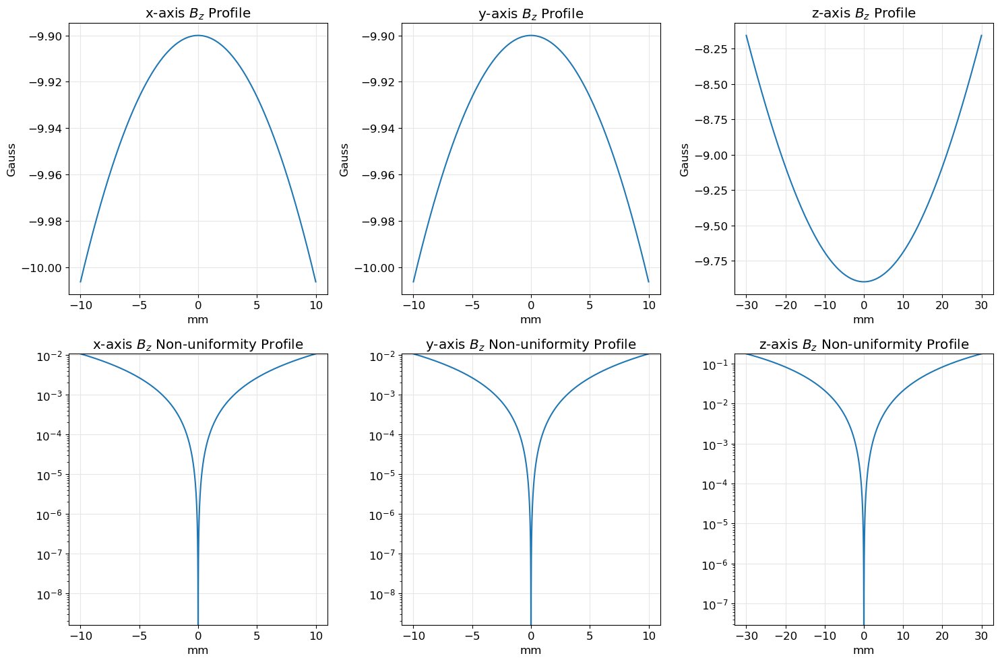

In [8]:
obj_ring_config=[[*ringset_1_config, *x[0:3], 0], [*ringset_2_config, *x[3:7]]]
magnets = n_rings(obj_ring_config)
sens_len = 10
get_field_on_axes(magnets, [[-sens_len, sens_len], [-sens_len, sens_len], [-sens_len-20, sens_len+20]], True)